# 3. Fitting models to data

In this workbook we will import data and find the cosmological model that best fits that data. 

### 3.1 First set up the packages and functions
We need to know the distance modulus as a function of redshift.  Distance modulus is defined as 
\begin{equation} \mu(z) = 5 \log_{10}(D_L)\end{equation}
where
\begin{equation} D_L = R_0 S_k(\chi) (1+z) \end{equation}
and $S_k(\chi)=\sin(\chi), \chi,\; {\rm or}\; \sinh(\chi)$ for closed, flat, and open universes respectively, and
\begin{equation} R_0\chi = \frac{c}{H_0}\int_0^z \frac{dz}{E(z)}\end{equation}
with $E(z)=H(z)/H_0$.

Note that the absolute magnitude of the SNe is about -19.5, but it enters as an additive constant in the same way as $c/H_0$ and both have high uncertainty.  Therefore we *marginalise* over this offset and it doesn't matter what value of $H_0$ we use.

#### Important: In the code below, replace ez = 1.0 with the actual function for E(z).


In [12]:
# First let's set up our packages
import numpy as np
from matplotlib import pyplot as plt
from scipy import integrate

# And set some constants
c = 299792.458 # km/s (speed of light)
H0kmsmpc = 70.  # Hubble constant in km/s/Mpc
H0s = H0kmsmpc * 3.2408e-20 # H0 in inverse seconds is H0 in km/s/Mpc * (3.2408e-20 Mpc/km)

# Write a function for the integrand, i.e. $1/E(z)$,
def ezinv(z,om=0.3,ol=0.7,w0=-1.0,wa=0.0,orr=0.0):
    ok = 1.-om-ol-orr
    # ez = np.sqrt((om*(1+z)**3) + (ok*(1+z)**2) + ((ol*(1+z)**(3*(1+w0+wa))*(np.exp(-3*wa*(1-(1/(1+z))))))))
    ez = np.sqrt((om*(1+z)**3) + (ok*(1+z)**2) + (ol*(1+z)**(3*(1+w0))))
    return 1./ez
                 
# The curvature correction function
def Sk(xx, ok):
    if ok < 0.0:
        dk = np.sin(np.sqrt(-ok)*xx)/np.sqrt(-ok)
    elif ok > 0.0:
        dk = np.sinh(np.sqrt(ok)*xx)/np.sqrt(ok)
    else:
        dk = xx
    return dk

# The distance modulus
def dist_mod(zs,om=0.3,ol=0.7,w0=-1.0,wa=0.0,orr=0.0):
    """ Calculate the distance modulus, correcting for curvature"""
    ok = 1.0 - om - ol
    z_array = np.linspace(0.01,1,50)
    xx_array = np.array([integrate.quad(ezinv, 0, z, args=(om, ol, w0, wa, orr))[0] for z in z_array])
    xx = np.interp(zs, z_array, xx_array)
    #xx = np.array([integrate.quad(ezinv, 0, z, args=(om, ol, w0, wa, orr))[0] for z in zs])
    D = Sk(xx, ok)
    lum_dist = D * (1 + zs) 
    dist_mod = 5 * np.log10(lum_dist) # Distance modulus
    # Add an arbitrary constant that's approximately the log of c on Hubble constant minus absolute magnitude of -19.5
    dist_mod = dist_mod + np.log(c/H0kmsmpc)-(-19.5)  # You can actually skip this step and it won't make a difference to our fitting
    return dist_mod

### 3.2 Now read in the data
I have generated some mock supernova data at random redshifts between $0.02<z<1.0$.  I then choose a cosmological model and calculate the distance modulus for each redshift in that model.  Then I give some uncertainty to the data points and scatter them randomly about the correct model by an amount corresponding to their uncertainty. 

I've generated 5 different models, all in files called DataX.txt, where X is a number from 0-4. 

There are five possible variables that I have specified in the models.  These are
* Matter density: $\Omega_M$
* Dark Energy density: $\Omega_\Lambda$
* Radiation density: $\Omega_R$
* Equation of state of dark energy: $w_0$
* Change in the equation of state with scalefactor: $w_a$, where $w=w_0+w_a(1-a)$.

You can test your code on Data00.txt and Data0.txt.  Both were generated using a model with $(\Omega_M,\Omega_{\Lambda})=(0.3,0.7)$ and all other parameters set to their standard values, namely $\Omega_R=0.0$, $w_0=-1.0$, $w_a=0.0$.  In addition Data00.txt has perfect data with no scatter and small uncertainties, so you should be able to recover exactly the correct model. 

Data sets 1-2 are models in which $\Omega_R=0.0$, $w_0=-1.0$, $w_a=0.0$ and only $\Omega_M$ and $\Omega_{\Lambda}$ change.  

Data sets 3-4 could be anything! (Within the realms of the five parameters described above.)

Feel free to choose which data set you want to analyse for your project.


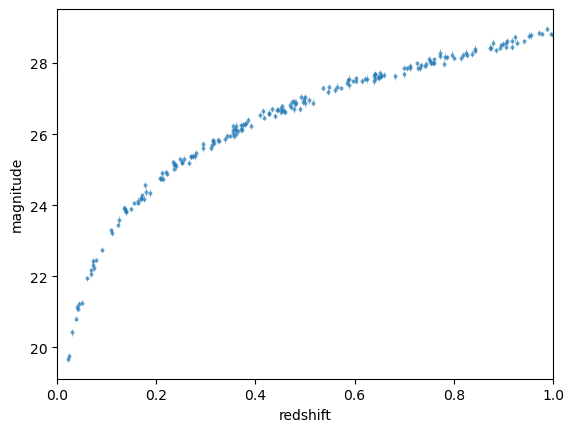

In [13]:
# Add a new function that reads in the data (data files should be in a directory called data)
def read_data(model_name):
    d = np.genfromtxt('data/'+model_name+'.txt',delimiter=',')
    zs = d[:,0]
    mu = d[:,1]
    muerr=d[:,2]
    # Sort the arrays based on zs
    sort_idx = np.argsort(zs)
    zs = zs[sort_idx]
    mu = mu[sort_idx]
    muerr = muerr[sort_idx]
    return zs, mu, muerr

zs, mu, muerr = read_data('data0')

# Plot it to see what it looks like, this is called a Hubble diagram
plt.errorbar(zs,mu,yerr=muerr,fmt='.',elinewidth=0.7,markersize=4,alpha=0.5)
plt.xlim(0,1.0)
plt.xlabel('redshift')
plt.ylabel('magnitude')
plt.show()

### 3.3 Calculate the theory corresponding to that data for a range of cosmological models
Then overplot them on the Hubble diagram.  Here we're just testing some specific interesting examples.
It's always important to visualise your data and check that the models and data are doing what you think they are!

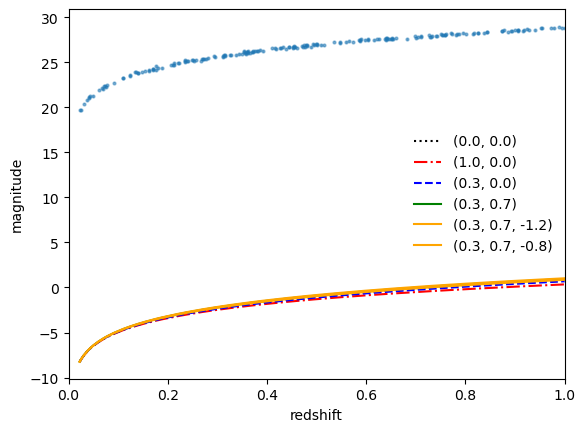

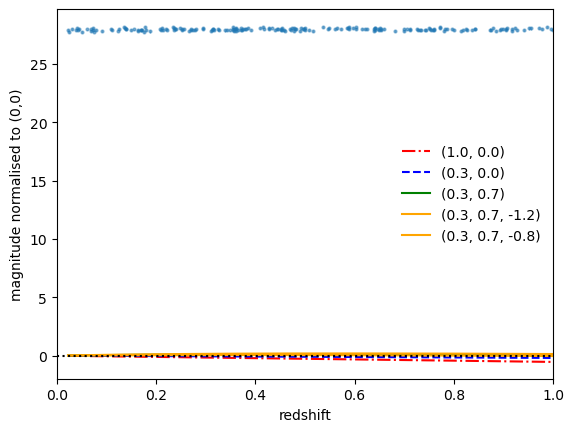

In [14]:
mu_om00_ox00 = dist_mod(zs,om=0.0,ol=0.0)  # We're going to use this empty model as a benchmark to compare the others to
mu_om10_ox00 = dist_mod(zs,om=1.0,ol=0.0)
mu_om03_ox00 = dist_mod(zs,om=0.3,ol=0.0)
mu_om03_ox07 = dist_mod(zs,om=0.3,ol=0.7)
mu_om03_ox07_w12 = dist_mod(zs,om=0.3,ol=0.7, w0=-1.2)
mu_om03_ox07_w08 = dist_mod(zs,om=0.3,ol=0.7, w0=-0.8)

# Plot it to see what it looks like, this is called a Hubble diagram
plt.errorbar(zs,mu,yerr=muerr,fmt='.',elinewidth=0.7,markersize=4,alpha=0.5)
plt.plot(zs,mu_om00_ox00,':',color='black',label='(0.0, 0.0)')
plt.plot(zs,mu_om10_ox00,'-.',color='red',label='(1.0, 0.0)')
plt.plot(zs,mu_om03_ox00,'--',color='blue',label='(0.3, 0.0)')
plt.plot(zs,mu_om03_ox07,'-',color='green',label='(0.3, 0.7)')
plt.plot(zs,mu_om03_ox07_w12,'-',color='orange',label='(0.3, 0.7, -1.2)')
plt.plot(zs,mu_om03_ox07_w08,'-',color='orange',label='(0.3, 0.7, -0.8)')
plt.xlim(0,1.0)
plt.xlabel('redshift')
plt.ylabel('magnitude')
plt.legend(frameon=False)
plt.show()

# Now plot a Hubble diagram relative to the empty model (i.e. subtract the empty model from all the data and models)
plt.errorbar(zs,mu-mu_om00_ox00,yerr=muerr,fmt='.',elinewidth=0.7,markersize=4,alpha=0.5)
plt.plot(zs,mu_om10_ox00-mu_om00_ox00,'-.',color='red',label='(1.0, 0.0)')
plt.plot(zs,mu_om03_ox00-mu_om00_ox00,'--',color='blue',label='(0.3, 0.0)')
plt.plot(zs,mu_om03_ox07-mu_om00_ox00,'-',color='green',label='(0.3, 0.7)')
plt.plot(zs,mu_om03_ox07_w12-mu_om00_ox00,'-',color='orange',label='(0.3, 0.7, -1.2)')
plt.plot(zs,mu_om03_ox07_w08-mu_om00_ox00,'-',color='orange',label='(0.3, 0.7, -0.8)')
plt.axhline(y=0.0,ls=':',color='black')
plt.xlim(0.0,1.0)
plt.xlabel('redshift')
plt.ylabel('magnitude normalised to (0,0)')
plt.legend(frameon=False)
plt.show()

### 3.4 Normalise the theory
You can see that there is a vertical offset between the different theory curves.  
We marginalise over this vertical offset, because we do not have enough information to constrain the vertical offset independently.
In other words we use the data to determine what the vertical offset should be, but we do not care about what the answer is!
(We are interested in the other parameters in the fit, but not that one.  The other parameters determine the *shape* of the curve.)

The easiest way to normalise the curves is to take a weighted average of the difference between the data points and the theory in each case.

-28.218836148632644 -28.048886015598395 -27.864212724071827


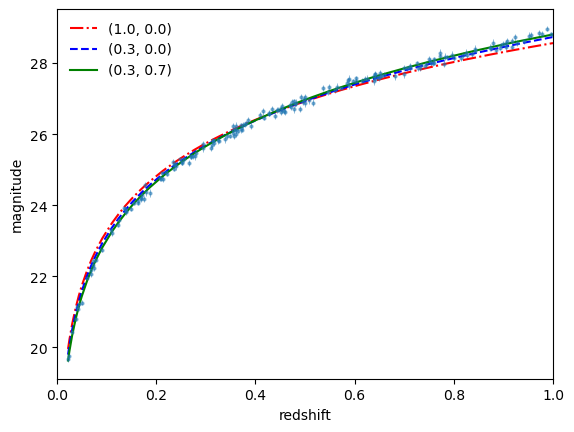

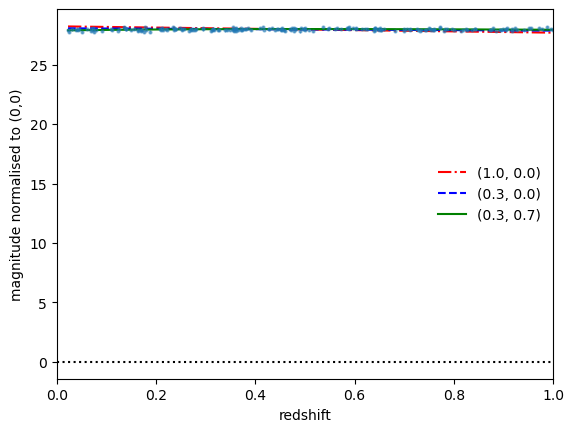

In [15]:
# Calculate mscript for each of these, which is the thing that determines the vertical normalisation 
mscr_om10_ox00 = np.sum((mu_om10_ox00-mu)/muerr**2)/np.sum(1./muerr**2)
mscr_om03_ox00 = np.sum((mu_om03_ox00-mu)/muerr**2)/np.sum(1./muerr**2)
mscr_om03_ox07 = np.sum((mu_om03_ox07-mu)/muerr**2)/np.sum(1./muerr**2)

print(mscr_om10_ox00,mscr_om03_ox00,mscr_om03_ox07)

mu_om10_ox00=mu_om10_ox00-mscr_om10_ox00
mu_om03_ox00=mu_om03_ox00-mscr_om03_ox00
mu_om03_ox07=mu_om03_ox07-mscr_om03_ox07

# Repeat the plot and see how it changes
# Plot it to see what it looks like, this is called a Hubble diagram
plt.errorbar(zs,mu,yerr=muerr,fmt='.',elinewidth=0.7,markersize=4,alpha=0.5)
plt.plot(zs,mu_om10_ox00,'-.',color='red',label='(1.0, 0.0)')
plt.plot(zs,mu_om03_ox00,'--',color='blue',label='(0.3, 0.0)')
plt.plot(zs,mu_om03_ox07,'-',color='green',label='(0.3, 0.7)')
plt.xlim(0,1.0)
plt.xlabel('redshift')
plt.ylabel('magnitude')
plt.legend(frameon=False)
plt.show()

# Now plot a Hubble diagram relative to the empty model (i.e. subtract the empty model from all the data and models)
plt.errorbar(zs,mu-mu_om00_ox00,yerr=muerr,fmt='.',elinewidth=0.7,markersize=4,alpha=0.5)
plt.plot(zs,mu_om10_ox00-mu_om00_ox00,'-.',color='red',label='(1.0, 0.0)')
plt.plot(zs,mu_om03_ox00-mu_om00_ox00,'--',color='blue',label='(0.3, 0.0)')
plt.plot(zs,mu_om03_ox07-mu_om00_ox00,'-',color='green',label='(0.3, 0.7)')
#plt.plot(zs, mu_om018_ox031 - mu_om00_ox00, '--', color='orange', label='(0.184, 0.301)')
#plt.plot(zs, mu_om10_ox00 - mu_om00_ox00, '--', color='orange', label='(1.0, 0.0)')

plt.axhline(y=0.0,ls=':',color='black')
plt.xlim(0,1.0)
plt.xlabel('redshift')
plt.ylabel('magnitude normalised to (0,0)')
plt.legend(frameon=False)
plt.show()

## 3.5 Perform a fit to many models 
To find the best model that best matches the data use a $\chi^2$ test.


-0.8 238.65999807242517
-1.0 217.69232131304108
-1.2 231.37295376491352
-0.9 216.23378489696705


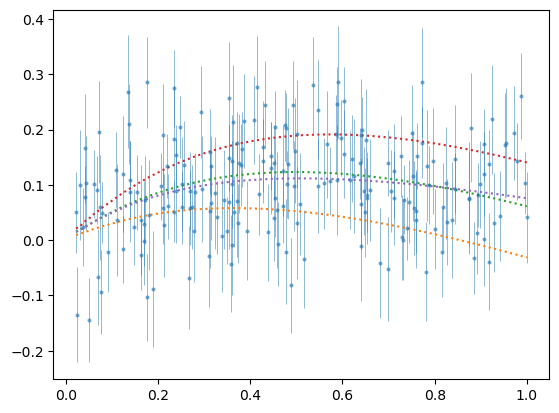

In [11]:
plt.errorbar(zs,mu-mu_om00_ox00,yerr=muerr,fmt='.',elinewidth=0.7,markersize=4,alpha=0.5)

for i,w0 in enumerate([-0.8,-1.0,-1.2]):
    mu_model = dist_mod(zs, om=0.3, ol=0.7, w0=w0)              # calculate the distance modulus vs redshift for that model 
    mscr = np.sum((mu_model-mu)/muerr**2)/np.sum(1./muerr**2) # Calculate the vertical offset to apply
    mu_model_norm = mu_model-mscr                             # Apply the vertical offset
    chi2 = np.sum((mu_model_norm - mu) ** 2 / muerr**2)  # Calculate the chi2 and save it in a matrix 

    plt.plot(zs,mu_model-mu_om00_ox00,':')
    print(w0,chi2)
    
mu_model = dist_mod(zs, om=0.184, ol=0.301, w0=-1.776)            # calculate the distance modulus vs redshift for that model 
mscr = np.sum((mu_model-mu)/muerr**2)/np.sum(1./muerr**2) # Calculate the vertical offset to apply
mu_model_norm = mu_model-mscr                             # Apply the vertical offset
chi2 = np.sum((mu_model_norm - mu) ** 2 / muerr**2)  # Calculate the chi2 and save it in a matrix 
print(-1.776,chi2)
plt.plot(zs,mu_model-mu_om00_ox00,':')
plt.show()

NO PRIORS

BEST FIT GLOBAL (3D CHI2, om,ol,w)

In [83]:
# Set up the arrays for the models you want to test, e.g. a range of Omega_m and Omega_Lambda models:
n = 80                # Increase this for a finer grid
oms = np.linspace(0.1, 0.7, n)   # Array of matter densities
ols = np.linspace(0.2, 1.0, n)   # Array of cosmological constant values
w0s = np.linspace(-1.9, -0.5, n)   # Array of cosmological constant values
wa = 0
chi2 = np.ones((n, n, n)) * np.inf  # Array to hold our chi2 values, set initially to super large values   
            
# Calculate Chi2 for each model
for i, om in enumerate(oms):                                          # loop through matter densities
       for j, ol in enumerate(ols):                                  # loop through cosmological constant densities
            for k, w0 in enumerate(w0s):
                mu_model = dist_mod(zs, om=om, ol=ol, w0=w0)              # calculate the distance modulus vs redshift for that model 
                mscr = np.sum((mu_model-mu)/muerr**2)/np.sum(1./muerr**2) # Calculate the vertical offset to apply
                mu_model_norm = mu_model-mscr                             # Apply the vertical offset
                chi2[i,j,k] = np.sum((mu_model_norm - mu) ** 2 / muerr**2)  # Calculate the chi2 and save it in a matrix 
                #print(oms[i],ols[j],w0s[k],chi2[i,j,k])
   
# Convert that to a likelihood and calculate the reduced chi2
likelihood = np.exp(-0.5 * (chi2-np.amin(chi2)))  # convert the chi^2 to a likelihood (np.amin(chi2) calculates the minimum of the chi^2 array)
chi2_reduced = chi2 / (len(mu)-2)                 # calculate the reduced chi^2, i.e. chi^2 per degree of freedom, where dof = number of data points minus number of parameters being fitted 

# Calculate the best fit values (where chi2 is minimum)
indbest = np.argmin(chi2)                 # Gives index of best fit but where the indices are just a single number
ibest   = np.unravel_index(indbest,[n,n,n]) # Converts the best fit index to the 2d version (i,j)
print( 'Best fit values are (om,ol, w0)=(%.3f,%.3f,%.3f)'%( oms[ibest[0]], ols[ibest[1]], w0s[ibest[2]]))
print( 'Reduced chi^2 for the best fit is %0.2f'%chi2_reduced[ibest[0],ibest[1], ibest[2]] )

# chi2temp is the sum of all w's for one om, ol pair
chi2temp = np.sum(chi2,axis=2)
for i, om in enumerate(oms):                                          # loop through matter densities
       for j, ol in enumerate(ols):   # loop through cosmological constant densities
            for k, w0 in enumerate(w0s):
                print(oms[i],ols[j],w0s[k],chi2[i,j,k])
            print(oms[i],ols[j],chi2temp[i,j]/n,'average')

Best fit values are (om,ol, w0)=(0.184,0.301,-1.776)
Reduced chi^2 for the best fit is 1.11
0.1 0.2 -1.9 217.7627677937731
0.1 0.2 -1.882278481012658 217.80324241992082
0.1 0.2 -1.8645569620253164 217.84568467256173
0.1 0.2 -1.8468354430379745 217.8901993357336
0.1 0.2 -1.8291139240506329 217.93689692667914
0.1 0.2 -1.811392405063291 217.98589399179917
0.1 0.2 -1.7936708860759494 218.03731341707146
0.1 0.2 -1.7759493670886075 218.09128475357264
0.1 0.2 -1.7582278481012659 218.14794455881616
0.1 0.2 -1.740506329113924 218.20743675460295
0.1 0.2 -1.7227848101265821 218.2699130021486
0.1 0.2 -1.7050632911392405 218.33553309523836
0.1 0.2 -1.6873417721518986 218.40446537224386
0.1 0.2 -1.669620253164557 218.47688714780645
0.1 0.2 -1.6518987341772151 218.55298516508384
0.1 0.2 -1.6341772151898732 218.63295606943845
0.1 0.2 -1.6164556962025316 218.71700690451354
0.1 0.2 -1.59873417721519 218.80535563166103
0.1 0.2 -1.581012658227848 218.89823167372293
0.1 0.2 -1.5632911392405062 218.99587648

0.10759493670886076 0.7974683544303798 -1.59873417721519 958.7463661993321
0.10759493670886076 0.7974683544303798 -1.581012658227848 939.2435859356134
0.10759493670886076 0.7974683544303798 -1.5632911392405062 919.7040034445391
0.10759493670886076 0.7974683544303798 -1.5455696202531646 900.1376654962735
0.10759493670886076 0.7974683544303798 -1.5278481012658227 880.5550070036754
0.10759493670886076 0.7974683544303798 -1.510126582278481 860.9668545793393
0.10759493670886076 0.7974683544303798 -1.4924050632911392 841.3844295720585
0.10759493670886076 0.7974683544303798 -1.4746835443037973 821.8193505494673
0.10759493670886076 0.7974683544303798 -1.4569620253164557 802.2836351935632
0.10759493670886076 0.7974683544303798 -1.439240506329114 782.7897015763738
0.10759493670886076 0.7974683544303798 -1.4215189873417722 763.350368783291
0.10759493670886076 0.7974683544303798 -1.4037974683544303 743.9788568524883
0.10759493670886076 0.7974683544303798 -1.3860759493670884 724.6887859996782
0.107

0.12278481012658228 0.6050632911392405 -1.740506329113924 469.41914477174055
0.12278481012658228 0.6050632911392405 -1.7227848101265821 464.2011422959913
0.12278481012658228 0.6050632911392405 -1.7050632911392405 458.93401818630673
0.12278481012658228 0.6050632911392405 -1.6873417721518986 453.6194930174537
0.12278481012658228 0.6050632911392405 -1.669620253164557 448.25941656675644
0.12278481012658228 0.6050632911392405 -1.6518987341772151 442.8557729806755
0.12278481012658228 0.6050632911392405 -1.6341772151898732 437.4106860512099
0.12278481012658228 0.6050632911392405 -1.6164556962025316 431.9264245983194
0.12278481012658228 0.6050632911392405 -1.59873417721519 426.4054079539182
0.12278481012658228 0.6050632911392405 -1.581012658227848 420.8502115423563
0.12278481012658228 0.6050632911392405 -1.5632911392405062 415.26357255163566
0.12278481012658228 0.6050632911392405 -1.5455696202531646 409.6483956888922
0.12278481012658228 0.6050632911392405 -1.5278481012658227 404.0077590129309


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.2746835443037975 0.7367088607594936 -1.2088607594936709 254.94175522504787
0.2746835443037975 0.7367088607594936 -1.1911392405063292 250.822174402399
0.2746835443037975 0.7367088607594936 -1.1734177215189874 246.88359748846688
0.2746835443037975 0.7367088607594936 -1.1556962025316455 243.13638692299207
0.2746835443037975 0.7367088607594936 -1.1379746835443039 239.59119052436358
0.2746835443037975 0.7367088607594936 -1.120253164556962 236.2589412799324
0.2746835443037975 0.7367088607594936 -1.1025316455696204 233.1508566239583
0.2746835443037975 0.7367088607594936 -1.0848101265822785 230.27843718030417
0.2746835443037975 0.7367088607594936 -1.0670886075949366 227.65346494769153
0.2746835443037975 0.7367088607594936 -1.049367088607595 225.2880009063584
0.2746835443037975 0.7367088607594936 -1.0316455696202533 223.19438202601015
0.2746835443037975 0.7367088607594936 -1.0139240506329115 221.38521765630983
0.2746835443037975 0.7367088607594936 -0.9962025316455697 219.8733852825893
0.27468

0.289873417721519 0.5746835443037974 -1.3860759493670884 225.2415828395371
0.289873417721519 0.5746835443037974 -1.3683544303797468 224.18597325472797
0.289873417721519 0.5746835443037974 -1.3506329113924052 223.1895218557259
0.289873417721519 0.5746835443037974 -1.3329113924050633 222.25611246226464
0.289873417721519 0.5746835443037974 -1.3151898734177214 221.38978843434472
0.289873417721519 0.5746835443037974 -1.2974683544303798 220.59475718707847
0.289873417721519 0.5746835443037974 -1.2797468354430381 219.87539471819156
0.289873417721519 0.5746835443037974 -1.2620253164556963 219.2362501386354
0.289873417721519 0.5746835443037974 -1.2443037974683544 218.6820501961056
0.289873417721519 0.5746835443037974 -1.2265822784810125 218.21770378046665
0.289873417721519 0.5746835443037974 -1.2088607594936709 217.8483063993932
0.289873417721519 0.5746835443037974 -1.1911392405063292 217.57914461168326
0.289873417721519 0.5746835443037974 -1.1734177215189874 217.41570040503922
0.289873417721519

0.2974683544303798 0.8784810126582279 -1.4215189873417722 444.47379578073753
0.2974683544303798 0.8784810126582279 -1.4037974683544303 432.69874471707124
0.2974683544303798 0.8784810126582279 -1.3860759493670884 421.0889181381315
0.2974683544303798 0.8784810126582279 -1.3683544303797468 409.65608656531293
0.2974683544303798 0.8784810126582279 -1.3506329113924052 398.4123291865493
0.2974683544303798 0.8784810126582279 -1.3329113924050633 387.3700325976605
0.2974683544303798 0.8784810126582279 -1.3151898734177214 376.54188897116865
0.2974683544303798 0.8784810126582279 -1.2974683544303798 365.9408936309311
0.2974683544303798 0.8784810126582279 -1.2797468354430381 355.5803420120535
0.2974683544303798 0.8784810126582279 -1.2620253164556963 345.47382598673744
0.2974683544303798 0.8784810126582279 -1.2443037974683544 335.635229538096
0.2974683544303798 0.8784810126582279 -1.2265822784810125 326.07872376560033
0.2974683544303798 0.8784810126582279 -1.2088607594936709 316.81876120747825
0.2974

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.9189873417721519 -1.7582278481012659 468.55070369629476
0.4417721518987342 0.9189873417721519 -1.740506329113924 459.5238295270526
0.4417721518987342 0.9189873417721519 -1.7227848101265821 450.5568264881982
0.4417721518987342 0.9189873417721519 -1.7050632911392405 441.6552118601679
0.4417721518987342 0.9189873417721519 -1.6873417721518986 432.8247046801067
0.4417721518987342 0.9189873417721519 -1.669620253164557 424.0712300635284
0.4417721518987342 0.9189873417721519 -1.6518987341772151 415.40092345973306
0.4417721518987342 0.9189873417721519 -1.6341772151898732 406.82013482778086
0.4417721518987342 0.9189873417721519 -1.6164556962025316 398.33543271916915
0.4417721518987342 0.9189873417721519 -1.59873417721519 389.953608252687
0.4417721518987342 0.9189873417721519 -1.581012658227848 381.6816789662315
0.4417721518987342 0.9189873417721519 -1.5632911392405062 373.52689252977615
0.4417721518987342 0.9189873417721519 -1.5455696202531646 365.49673030297305
0.4417721518987342 0.9189873417

0.4569620253164557 0.5544303797468355 -1.0316455696202533 293.0352862625035
0.4569620253164557 0.5544303797468355 -1.0139240506329115 296.6308765255882
0.4569620253164557 0.5544303797468355 -0.9962025316455697 300.40532329891056
0.4569620253164557 0.5544303797468355 -0.978481012658228 304.3649966456244
0.4569620253164557 0.5544303797468355 -0.9607594936708861 308.5164522634111
0.4569620253164557 0.5544303797468355 -0.9430379746835443 312.8664341761024
0.4569620253164557 0.5544303797468355 -0.9253164556962026 317.42187726722034
0.4569620253164557 0.5544303797468355 -0.9075949367088608 322.1899096394758
0.4569620253164557 0.5544303797468355 -0.8898734177215191 327.1778547837238
0.4569620253164557 0.5544303797468355 -0.8721518987341772 332.3932335404686
0.4569620253164557 0.5544303797468355 -0.8544303797468356 337.8437658365975
0.4569620253164557 0.5544303797468355 -0.8367088607594937 343.5373721796442
0.4569620253164557 0.5544303797468355 -0.818987341772152 349.48217489166836
0.456962025

0.4721518987341772 0.3721518987341772 -1.2974683544303798 325.5883668561879
0.4721518987341772 0.3721518987341772 -1.2797468354430381 327.38972212926376
0.4721518987341772 0.3721518987341772 -1.2620253164556963 329.25867674275094
0.4721518987341772 0.3721518987341772 -1.2443037974683544 331.1973533851415
0.4721518987341772 0.3721518987341772 -1.2265822784810125 333.2079450249922
0.4721518987341772 0.3721518987341772 -1.2088607594936709 335.2927171691304
0.4721518987341772 0.3721518987341772 -1.1911392405063292 337.4540101764528
0.4721518987341772 0.3721518987341772 -1.1734177215189874 339.6942416270671
0.4721518987341772 0.3721518987341772 -1.1556962025316455 342.01590874633825
0.4721518987341772 0.3721518987341772 -1.1379746835443039 344.4215908832225
0.4721518987341772 0.3721518987341772 -1.120253164556962 346.91395204207663
0.4721518987341772 0.3721518987341772 -1.1025316455696204 349.4957434669285
0.4721518987341772 0.3721518987341772 -1.0848101265822785 352.1698062769144
0.4721518

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 -1.8291139240506329 339.69250537929315
0.6240506329113924 0.5139240506329115 -1.811392405063291 340.1989673722253
0.6240506329113924 0.5139240506329115 -1.7936708860759494 340.7514556334259
0.6240506329113924 0.5139240506329115 -1.7759493670886075 341.3513241841812
0.6240506329113924 0.5139240506329115 -1.7582278481012659 341.9999685670896
0.6240506329113924 0.5139240506329115 -1.740506329113924 342.6988271840372
0.6240506329113924 0.5139240506329115 -1.7227848101265821 343.44938267512407
0.6240506329113924 0.5139240506329115 -1.7050632911392405 344.25316333942135
0.6240506329113924 0.5139240506329115 -1.6873417721518986 345.11174459841817
0.6240506329113924 0.5139240506329115 -1.669620253164557 346.02675050300707
0.6240506329113924 0.5139240506329115 -1.6518987341772151 346.9998552848209
0.6240506329113924 0.5139240506329115 -1.6341772151898732 348.0327849527225
0.6240506329113924 0.5139240506329115 -1.6164556962025316 349.12731893515763
0.6240506329113924 0.5139240506329115 -1.59873

0.6392405063291139 0.3721518987341772 -0.6063291139240508 636.1823503951748
0.6392405063291139 0.3721518987341772 -0.5886075949367089 643.9503314852742
0.6392405063291139 0.3721518987341772 -0.5708860759493672 651.9502329758067
0.6392405063291139 0.3721518987341772 -0.5531645569620254 660.188412539935
0.6392405063291139 0.3721518987341772 -0.5354430379746837 668.6713799669719
0.6392405063291139 0.3721518987341772 -0.5177215189873419 677.4057985449585
0.6392405063291139 0.3721518987341772 -0.5 686.3984862783673
0.6392405063291139 0.3721518987341772 500.4599136435885 average
0.6392405063291139 0.38227848101265827 -1.9 412.59807028156786
0.6392405063291139 0.38227848101265827 -1.882278481012658 413.14608006064975
0.6392405063291139 0.38227848101265827 -1.8645569620253164 413.7272430644597
0.6392405063291139 0.38227848101265827 -1.8468354430379745 414.3424213867082
0.6392405063291139 0.38227848101265827 -1.8291139240506329 414.99250095514753
0.6392405063291139 0.38227848101265827 -1.811392

0.6468354430379747 0.959493670886076 -1.7582278481012659 357.565770565163
0.6468354430379747 0.959493670886076 -1.740506329113924 352.474710145406
0.6468354430379747 0.959493670886076 -1.7227848101265821 347.50496845316286
0.6468354430379747 0.959493670886076 -1.7050632911392405 342.66131652034346
0.6468354430379747 0.959493670886076 -1.6873417721518986 337.94867436202185
0.6468354430379747 0.959493670886076 -1.669620253164557 333.37211435048977
0.6468354430379747 0.959493670886076 -1.6518987341772151 328.936864575661
0.6468354430379747 0.959493670886076 -1.6341772151898732 324.64831218410103
0.6468354430379747 0.959493670886076 -1.6164556962025316 320.51200668844234
0.6468354430379747 0.959493670886076 -1.59873417721519 316.53366323836667
0.6468354430379747 0.959493670886076 -1.581012658227848 312.71916584393625
0.6468354430379747 0.959493670886076 -1.5632911392405062 309.0745705413699
0.6468354430379747 0.959493670886076 -1.5455696202531646 305.60610849094746
0.6468354430379747 0.959

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2D CHI2 (OM, OL)

In [ ]:
# Set up the arrays for the models you want to test, e.g. a range of Omega_m and Omega_Lambda models:
w0 = -1.0   
chi2_2d = np.ones((n, n)) * np.inf  # Array to hold our chi2 values, set initially to super large values

# Calculate Chi2 for each model
for i, om in enumerate(oms):                                          # loop through matter densities
    for j, ol in enumerate(ols):                                  # loop through cosmological constant densities
        mu_model = dist_mod(zs, om=om, ol=ol, w0=w0)                     # calculate the distance modulus vs redshift for that model 
        mscr = np.sum((mu_model-mu)/muerr**2)/np.sum(1./muerr**2) # Calculate the vertical offset to apply
        mu_model_norm = mu_model-mscr                             # Apply the vertical offset
        chi2_2d[i,j] = np.sum((mu_model_norm - mu) ** 2 / muerr**2)  # Calculate the chi2 and save it in a matrix 

# Convert that to a likelihood and calculate the reduced chi2
likelihood_2d = np.exp(-0.5 * (chi2_2d-np.amin(chi2_2d)))  # convert the chi^2 to a likelihood (np.amin(chi2) calculates the minimum of the chi^2 array)
chi2_2d_reduced = chi2_2d / (len(mu)-2)                 # calculate the reduced chi^2, i.e. chi^2 per degree of freedom, where dof = number of data points minus number of parameters being fitted 

# Calculate the best fit values (where chi2 is minimum)
indbest_2d = np.argmin(chi2_2d)                 # Gives index of best fit but where the indices are just a single number
ibest_2d   = np.unravel_index(indbest_2d,[n,n]) # Converts the best fit index to the 2d version (i,j)
print( 'Best fit values are (om,ol)=(%.3f,%.3f)'%( oms[ibest_2d[0]], ols[ibest_2d[1]]))
print( 'Reduced chi^2 for the best fit is %0.2f'%chi2_2d_reduced[ibest_2d[0],ibest_2d[1]] )

In [ ]:
def plot_contour(x,y,z,xlabel,ylabel,levels=[2.30,6.18,11.83]):
    indbest = np.argmin(z)                 # Gives index of best fit but where the indices are just a single number
    ibest   = np.unravel_index(indbest,[n,n]) # Converts the best fit index to the 2d version (i,j)
    print( 'Best fit values in 2D are (%s,%s)=(%.3f,%.3f)'%( xlabel,ylabel,x[ibest[0]], y[ibest[1]]))
    
    plt.contour(x,y,np.transpose(z-np.amin(z)),cmap="winter",**{'levels':[2.30,6.18,11.83]}) #6.25,11.34,16.27]})
    plt.plot(x[ibest[0]], y[ibest[1]],'x',color='black',label='(%s,%s)=(%.3f,%.3f)'%(xlabel,ylabel,x[ibest[0]],y[ibest[1]]) )
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.legend(frameon=False)
    plt.show()
    plt.close()


2D PLOT BELOW

In [ ]:
plot_contour(oms,ols,chi2_2d,"$\Omega_m$","$\Omega_l$")

w taken from the from the from the global: and a new 2D chi clalculated (margenilised over w)

In [ ]:
plot_contour(oms,ols,chi2[:,:,ibest[2]],"$\Omega_m$","$\Omega_l$")

ol taken from the from the from the global: and a new 2D chi clalculated (margenilised over w)

In [ ]:
plot_contour(oms,w0s,chi2[:,ibest[1],:],"$\Omega_m$","$w$")
#plot_contour(oms,w0s,np.sum(chi2,axis=1)/n,"$\Omega_m$","$w$")

om taken from the from the from the global: and a new 2D chi clalculated (margenilised over om)

In [ ]:
plot_contour(ols,w0s,chi2[ibest[0],:,:],"$\Omega_l$","$w$")
#plot_contour(ols,w0s,np.sum(chi2,axis=0)/n,"$\Omega_l$","$w$")

INCLUDE PRIOR of OM=0.27 +/- 0.05
AND
INCLUDE PRIOR of OM+OL=1.00 +/- 0.02